1. Importing 

In [2]:
#Importing needed programs  
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib notebook
%matplotlib inline
import seaborn as sns

!pip install six
from six import StringIO

from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier

from IPython.display import Image  
import graphviz
from sklearn.tree import export_graphviz
import pydotplus
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve


In [3]:
#Here we mount google drive in order to read in the files we need
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
#reading in the census data so that we can begin our data quality analysis
census_data = pd.read_csv('/content/drive/My Drive/Colab Notebooks/census_data.csv')

2. Data Quality Analysis


In [5]:
#This shows the amount of rows and columns in our dataset
census_data.shape

(48842, 11)

In [6]:
#showing the first five rows of our dataset to get an understanding of what it looks like
census_data.head()

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,0
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,0
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,0


In [7]:
#Here we are checking for the amount of null values in each column to see if there needs to be cleaning on that
census_data.isnull().sum()

hours_per_week_bin    0
occupation_bin        0
msr_bin               0
capital_gl_bin        0
race_sex_bin          0
education_num_bin     0
education_bin         0
workclass_bin         0
age_bin               0
flag                  0
y                     0
dtype: int64

In [8]:
#Now we look at the descriptive statistics for each column to understand dataset better. 
census_data.describe(include = 'all')
#The y column is the only column with numerical values 

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
count,48842,48842,48842,48842,48842,48842,48842,48842,48842,48842,48842.000000
unique,5,5,3,3,3,5,5,2,5,2,NaN
top,b. 31-40,c. Mid - Mid,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,e. 40-55,train,NaN
freq,26639,13971,22047,42525,29737,30324,30324,46012,13963,32561,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.239282
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.426649
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000


In [9]:
#Finally, we use the info function to determine the amount of non-null values are in each column and the datatype
census_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   hours_per_week_bin  48842 non-null  object
 1   occupation_bin      48842 non-null  object
 2   msr_bin             48842 non-null  object
 3   capital_gl_bin      48842 non-null  object
 4   race_sex_bin        48842 non-null  object
 5   education_num_bin   48842 non-null  object
 6   education_bin       48842 non-null  object
 7   workclass_bin       48842 non-null  object
 8   age_bin             48842 non-null  object
 9   flag                48842 non-null  object
 10  y                   48842 non-null  int64 
dtypes: int64(1), object(10)
memory usage: 4.1+ MB


3. Exploratory Data Analysis (EDA)

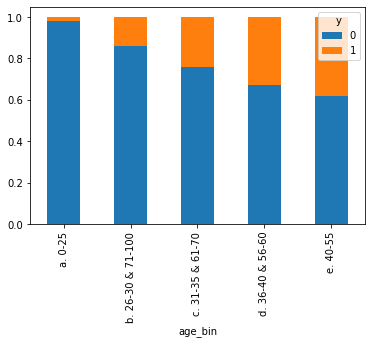

In [10]:
#Here we are trying to better understand our data and get a depiction of what it looks like
#Thus, we are putting each of our variables into bins and creating a stacked bar chart 
#for each income group based on their bin

#we are also going to standardize the data so each one is out of 1

#1. Age Bin

pd.crosstab(census_data['age_bin'],census_data['y'],normalize='index').plot(kind='bar',stacked=True)

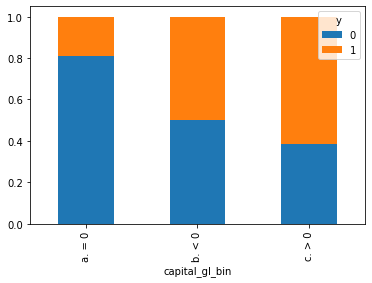

In [11]:
#2. Capital Gain Bin
pd.crosstab(census_data['capital_gl_bin'],census_data['y'],normalize='index').plot(kind='bar',stacked=True)

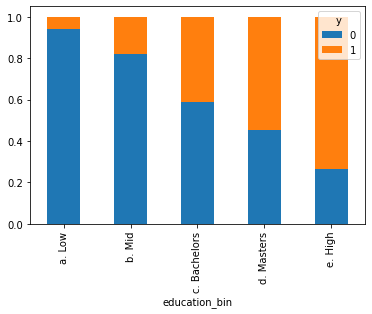

In [12]:
#3. Education Bin
pd.crosstab(census_data['education_bin'],census_data['y'],normalize='index').plot(kind='bar',stacked=True)


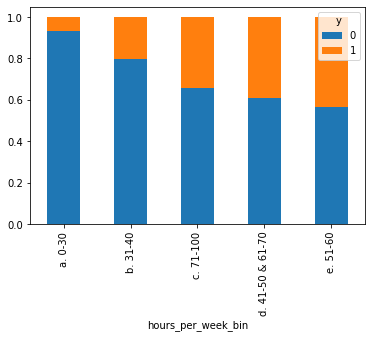

In [13]:
#4. Hours Per Week
pd.crosstab(census_data['hours_per_week_bin'],census_data['y'],normalize='index').plot(kind='bar',stacked=True)

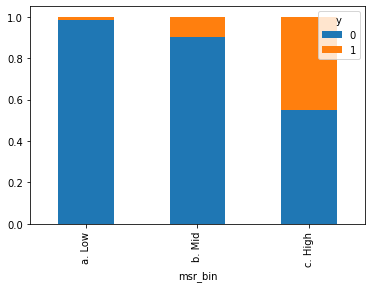

In [14]:
#5. Marriage Status and Relationship Bin
pd.crosstab(census_data['msr_bin'],census_data['y'],normalize='index').plot(kind='bar',stacked=True)

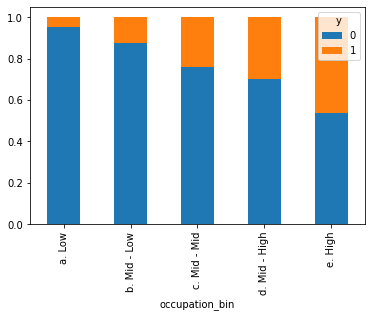

In [15]:
#6. Occupation Bin
pd.crosstab(census_data['occupation_bin'],census_data['y'],normalize='index').plot(kind='bar',stacked=True)

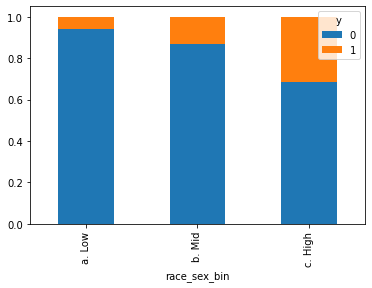

In [16]:
#7. Race/Sex Bin
pd.crosstab(census_data['race_sex_bin'],census_data['y'],normalize='index').plot(kind='bar',stacked=True)

4. Build Decision Tree Classifier Models

In [17]:
#now we need to separate our data into train data and test data. 
#The first step in doing this is separating them by their flag value

#We will do this for each type and print out the head to make sure it is 
#working properly

train_data=census_data[census_data['flag']=='train']
train_data.head()

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,0
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,0
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,0


In [18]:
#train data looks good so running it on test data

test_data=census_data[census_data['flag']=='test']
test_data

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
32561,b. 31-40,b. Mid - Low,a. Low,a. = 0,b. Mid,a. 0-8,a. Low,b. income,a. 0-25,test,0
32562,d. 41-50 & 61-70,b. Mid - Low,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,test,0
32563,b. 31-40,d. Mid - High,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,b. 26-30 & 71-100,test,1
32564,b. 31-40,b. Mid - Low,c. High,c. > 0,b. Mid,b. 9-12,b. Mid,b. income,e. 40-55,test,1
32565,a. 0-30,b. Mid - Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,a. no income,a. 0-25,test,0
...,...,...,...,...,...,...,...,...,...,...,...
48837,b. 31-40,e. High,b. Mid,a. = 0,b. Mid,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,test,0
48838,b. 31-40,b. Mid - Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,a. no income,c. 31-35 & 61-70,test,0
48839,d. 41-50 & 61-70,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,test,0
48840,b. 31-40,b. Mid - Low,a. Low,c. > 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,test,0


In [19]:
#now we are creating dummy variables for our data. This will allow us to easily 
#make a predicition later on by simply filling in 1s and 0s where necessary


x_train = pd.get_dummies(train_data[['age_bin', 'capital_gl_bin', 
                                     'education_bin','hours_per_week_bin', 
                                     'msr_bin', 'occupation_bin', 
                                     'race_sex_bin','education_num_bin',
                                     'workclass_bin']],drop_first=True)
y_train=train_data['y']

x_test=pd.get_dummies(test_data[['age_bin', 'capital_gl_bin', 
                                 'education_bin','hours_per_week_bin', 
                                 'msr_bin', 'occupation_bin', 'race_sex_bin',
                                 'education_num_bin','workclass_bin']],
                      drop_first=True)
y_test=test_data['y']

In [20]:
#this is where we build our tree from the decision tree classifier and 
#will allow us to make predicitons about y

dtree=DecisionTreeClassifier(max_depth=10,random_state=101, 
                             max_features=None, min_samples_leaf=15)
dtree.fit(x_train,y_train)
y_pred=dtree.predict(x_test)


#CA03 also asks for our run time to train the model and this is what we are 
#doing below

import timeit
code_to_test = """
a = range(100000)
b = []
for i in a:
    b.append(i*2)
"""
elapsed_time = timeit.timeit(code_to_test, number=100)/100
print(elapsed_time)


0.015175467099999763


In [21]:
#our run time is 0.01416 seconds

5. Visualize 

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.889417 to fit



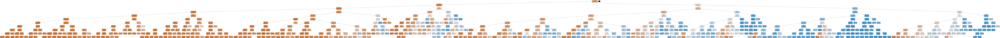

In [22]:
#At the top we had to use !pip install six because sklearn wasn't working. 
#We then installed StringIO in order to run the following code
#this code generates a decision tree from our dataset 

from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()
export_graphviz(dtree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

6. Evaluate Decision Tree Performance 

[[11521   914]
 [ 1653  2193]]


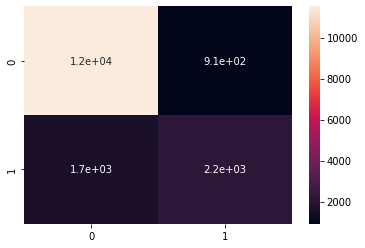

In [23]:
# Below we are going to print a confusion matrix and heat map for our 
#y test and y pred

print(metrics.confusion_matrix(y_test, y_pred))
sns.heatmap(metrics.confusion_matrix(y_test, y_pred), annot=True)

In [24]:
# Now we want the accuracy, precision, recall, F1, AUC, and ROC
# below we will start with the accuracy of our prediciton
#our accuracy is 84.3% 

print(accuracy_score(y_test, y_pred))

0.8423315521159634


In [25]:
#Next is the precision, recall, and F1 Scores for our data
#The F1 score shows us the balance between the precision and recall 
#and we want that to be as high as possible

print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.71      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.77     16281
weighted avg       0.83      0.84      0.84     16281



In [26]:
#Next is the AUC value which stands for area under curve and show accuracy 
#of our prediciton furthered
print(roc_auc_score(y_test, y_pred))

0.7483502983062628


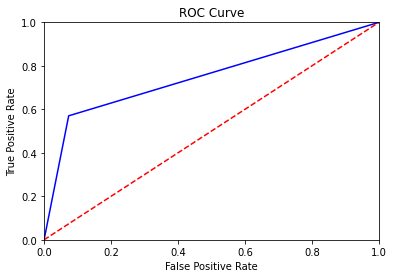

In [27]:
#Lastly, we want to generate the ROC graph
#fpr is false positive rate
#tpr is true positive rate
#This graph shows us the TPR versus FPR at different thresholds

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)

plt.figure()

##Analysis for what the graph means
plt.plot(fpr, tpr, color='blue')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')

#plotting the limits for our graph
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])

#labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

#ROC Graph title
plt.title('ROC Curve')
plt.show()

7. Tune Decision Tree Performance


In [28]:
#Here we are reading the Tree Tuning Cases sheet (Decision Tree Hyperparameter Variations Vs, Tree Performance)
tree_tuning_cases = pd.read_csv('/content/drive/My Drive/tree_tuning_cases.csv')
tree_tuning_cases

,Split Criteria (Entropy or Gini),Minimum Sample Split,Minimum Sample Leaf,Maximum Depth,Accuracy,Recall,Precision,F1 Score
0,Entropy,4,20,40,0.84380,0.84,0.84,0.84
1,Entropy,8,16,30,0.84214,0.84,0.83,0.84
2,Entropy,16,8,20,0.83870,0.84,0.83,0.83
3,Entropy,20,4,10,0.84440,0.84,0.84,0.84
4,Gini Impurity,4,20,40,0.84250,0.84,0.84,0.84
5,Gini Impurity,8,16,30,0.84300,0.84,0.84,0.84
6,Gini Impurity,16,8,20,0.83907,0.84,0.83,0.83
7,Gini Impurity,20,4,10,0.84470,0.84,0.84,0.84


Entropy

In [29]:
#now we are going to input our values displayed above using entropy 
#and gini and determine our values from that. These ones are for entropy and 
#I will state when I do Gini below

#DECISION TREE 1 --------------------

dtree1 = DecisionTreeClassifier(criterion='entropy', min_samples_split=4,max_depth=40, min_samples_leaf=20)
dtree1.fit(x_train,y_train)
y_pred1=dtree1.predict(x_test)

accuracy1=accuracy_score(y_test, y_pred)

print('TREE 1')
print("Accuracy:",accuracy1)
print('')
print(classification_report(y_test, y_pred))

TREE 1
Accuracy: 0.8423315521159634

              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.71      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.77     16281
weighted avg       0.83      0.84      0.84     16281



In [30]:
#DECISION TREE 2 --------------------

dtree2 = DecisionTreeClassifier(criterion='entropy', min_samples_split=8,max_depth=30, min_samples_leaf=16)
dtree2.fit(x_train,y_train)
y_pred2=dtree2.predict(x_test)

accuracy2=accuracy_score(y_test, y_pred2)

print('TREE 2')
print("Accuracy:",accuracy2)
print('')
print(classification_report(y_test, y_pred2))

TREE 2
Accuracy: 0.8404274921687857

              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.70      0.56      0.62      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.74      0.76     16281
weighted avg       0.83      0.84      0.83     16281



In [31]:
#DECISION TREE 3 --------------------

dtree3 = DecisionTreeClassifier(criterion='entropy', min_samples_split=16,max_depth=20, min_samples_leaf=8)
dtree3.fit(x_train,y_train)
y_pred3=dtree3.predict(x_test)

accuracy3=accuracy_score(y_test, y_pred3)

print('TREE 3')
print("Accuracy:",accuracy3)
print('')
print(classification_report(y_test, y_pred3))

TREE 3
Accuracy: 0.8398747005712179

              precision    recall  f1-score   support

           0       0.87      0.92      0.90     12435
           1       0.70      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.76     16281
weighted avg       0.83      0.84      0.83     16281



In [32]:
#DECISION TREE 4 --------------------

dtree4 = DecisionTreeClassifier(criterion='entropy', min_samples_split=20,max_depth=10, min_samples_leaf=4)
dtree4.fit(x_train,y_train)
y_pred4=dtree4.predict(x_test)

accuracy4=accuracy_score(y_test, y_pred4)

print('TREE 4')
print("Accuracy:",accuracy4)
print('')
print(classification_report(y_test, y_pred4))

TREE 4
Accuracy: 0.8403046495915484

              precision    recall  f1-score   support

           0       0.87      0.92      0.90     12435
           1       0.70      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.76     16281
weighted avg       0.83      0.84      0.83     16281



GINI Impurity

In [33]:
#DECISION TREE 5 --------------------

dtree5 = DecisionTreeClassifier(min_samples_split=4,max_depth=40, min_samples_leaf=20)
dtree5.fit(x_train,y_train)
y_pred5=dtree5.predict(x_test)

accuracy5=accuracy_score(y_test, y_pred5)

print('TREE 5')
print("Accuracy:",accuracy5)
print('')
print(classification_report(y_test, y_pred5))

TREE 5
Accuracy: 0.8400589644370738

              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.70      0.56      0.62      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.74      0.76     16281
weighted avg       0.83      0.84      0.83     16281



In [34]:
#DECISION TREE 6 --------------------

dtree6 = DecisionTreeClassifier(min_samples_split=8,max_depth=30, min_samples_leaf=16)
dtree6.fit(x_train,y_train)
y_pred6=dtree6.predict(x_test)

accuracy6=accuracy_score(y_test, y_pred6)

print('TREE 6')
print("Accuracy:",accuracy6)
print('')
print(classification_report(y_test, y_pred6))

TREE 6
Accuracy: 0.8401818070143111

              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.70      0.56      0.62      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.74      0.76     16281
weighted avg       0.83      0.84      0.83     16281



In [35]:
#DECISION TREE 7 --------------------

dtree7 = DecisionTreeClassifier(min_samples_split=16,max_depth=20, min_samples_leaf=8)
dtree7.fit(x_train,y_train)
y_pred7=dtree7.predict(x_test)

accuracy7=accuracy_score(y_test, y_pred7)

print('TREE 7')
print("Accuracy:",accuracy7)
print('')
print(classification_report(y_test, y_pred7))

TREE 7
Accuracy: 0.839199066396413

              precision    recall  f1-score   support

           0       0.87      0.92      0.90     12435
           1       0.70      0.57      0.62      3846

    accuracy                           0.84     16281
   macro avg       0.78      0.74      0.76     16281
weighted avg       0.83      0.84      0.83     16281



In [36]:
#DECISION TREE 8 --------------------

dtree8 = DecisionTreeClassifier(min_samples_split=20,max_depth=10, min_samples_leaf=4)
dtree8.fit(x_train,y_train)
y_pred8=dtree8.predict(x_test)

accuracy8=accuracy_score(y_test, y_pred8)

print('TREE 8')
print("Accuracy:",accuracy8)
print('')
print(classification_report(y_test, y_pred8))

TREE 8
Accuracy: 0.8404889134574043

              precision    recall  f1-score   support

           0       0.87      0.92      0.90     12435
           1       0.70      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.76     16281
weighted avg       0.83      0.84      0.83     16281



In [37]:
#here is our final table from excel with all values put in

tree_tuning_cases_fin = pd.read_csv('/content/drive/My Drive/tree_tuning_cases_fin1.csv')
tree_tuning_cases_fin

,Split Criteria (Entropy or Gini),Minimum Sample Split,Minimum Sample Leaf,Maximum Depth,Accuracy,Recall,Precision,F1 Score
0,Entropy,4,20,40,0.84230,0.84,0.83,0.84
1,Entropy,8,16,30,0.84040,0.84,0.83,0.83
2,Entropy,16,8,20,0.83980,0.84,0.83,0.83
3,Entropy,20,4,10,0.84030,0.84,0.83,0.83
4,Gini Impurity,4,20,40,0.84000,0.84,0.83,0.83
5,Gini Impurity,8,16,30,0.84010,0.84,0.83,0.83
6,Gini Impurity,16,8,20,0.83907,0.84,0.83,0.83
7,Gini Impurity,20,4,10,0.84040,0.84,0.83,0.83


In [38]:
#best tree is tree #1
#this is because it has the best recall, precision, f1 score, and accuracy
#we are visualizing it below

new_data = StringIO()
export_graphviz(dtree1, out_file=new_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(new_data.getvalue())  
Image(graph.create_png())


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.784031 to fit



8. Automation of Performance Tuning

In [39]:
#Automation of Performance Tuning
#Now we are going to automate the process we just did so that it all runs 
#in one smooth code
#This is done with a for loop just going through our data to check if we want 
#to use entropy or Gini and then running the same process for each one based on our values


for i in range(len(tree_tuning_cases)):
  if tree_tuning_cases['Split Criteria (Entropy or Gini)'][i] == 'Entropy':

    dtree=DecisionTreeClassifier(criterion='entropy', min_samples_split=tree_tuning_cases['Minimum Sample Split'][i],max_depth=tree_tuning_cases['Maximum Depth'][i], min_samples_leaf=tree_tuning_cases['Minimum Sample Leaf'][i])
    dtree.fit(x_train,y_train)
    y_pred=dtree.predict(x_test)
    print('Criteria: ENTROPY')
    accuracy=accuracy_score(y_test, y_pred)
    print("Accuracy:",accuracy)

    print(classification_report(y_test, y_pred))
    print('-'*60)
  else:

    dtree=DecisionTreeClassifier(min_samples_split=tree_tuning_cases['Minimum Sample Split'][i],max_depth=tree_tuning_cases['Maximum Depth'][i], min_samples_leaf=tree_tuning_cases['Minimum Sample Leaf'][i])
    dtree.fit(x_train,y_train)
    y_pred=dtree.predict(x_test)
    print('Criteria: GINI')
    accuracy=accuracy_score(y_test, y_pred)
    print("Accuracy:",accuracy)

    print(classification_report(y_test, y_pred))
    print('-'*60)

Criteria: ENTROPY
Accuracy: 0.841041705054972
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.70      0.56      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.76     16281
weighted avg       0.83      0.84      0.83     16281

------------------------------------------------------------
Criteria: ENTROPY
Accuracy: 0.8404274921687857
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.70      0.56      0.62      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.74      0.76     16281
weighted avg       0.83      0.84      0.83     16281

------------------------------------------------------------
Criteria: ENTROPY
Accuracy: 0.8398747005712179
              precision    recall  f1-score   support

           0       0.87      

9. Prediction Using Your "Trained" Decision Tree Model

In [40]:
#Now we are given a set of values from the CA03, these values will be the values
#we plug in and use to predict income. The model we will use is model 8
#because that was our best model when testing. The paramters for our data is 
#as follows: 

#Hours Worked per Week = 48 
#Occupation Category = Mid - Low 
#Marriage Status & Relationships = High 
#Capital Gain = Yes 
#Race-Sex Group = Mid 
#Number of Years of Education = 12 
#Education Category = High 
#Work Class = Income 
#Age = 58 


#We want to use our model with these parameters to predict income 
#(less than or equal to 50k or greater than 50k)

#Our first stwp will be to create a dataframe that includes these parameters 
#with 1s and 0s

pred_df=pd.DataFrame({'age_bin_b. 26-30 & 71-100':0,'age_bin_c. 31-35 & 61-70':0,
                 'age_bin_d. 36-40 & 56-60':1,'age_bin_e. 40-55':0,
                 'capital_gl_bin_b. < 0':0,'capital_gl_bin_c. > 0':1,
                 'education_bin_b. Mid':0,'education_bin_c. Bachelors':0,
                 'education_bin_d. Masters':0,'education_bin_e. High':1,
                 'hours_per_week_bin_b. 31-40':0,
                 'hours_per_week_bin_c. 71-100':0,
                 'hours_per_week_bin_d. 41-50 & 61-70':1,
                 'hours_per_week_bin_e. 51-60':0,'msr_bin_b. Mid':0,
                 'msr_bin_c. High':1,'occupation_bin_b. Mid - Low':1,
                 'occupation_bin_c. Mid - Mid':0,
                 'occupation_bin_d. Mid - High':0,'occupation_bin_e. High':0,
                 'race_sex_bin_b. Mid':1,'race_sex_bin_c. High':0,
                 'education_num_bin_b. 9-12':1,'education_num_bin_c. 13':0,
                 'education_num_bin_d. 14':0,'education_num_bin_e. 15+':0,
                 'workclass_bin_b. income':1},index=[0])

#if our dataframe is correct, it should look similar to our previous dataframe 
#but with 1s and 0s filled in 


In [41]:
#here we are going to print out our prediciton dataframe to make sure that 
#it is working correctly

pred_df

,age_bin_b. 26-30 & 71-100,age_bin_c. 31-35 & 61-70,age_bin_d. 36-40 & 56-60,age_bin_e. 40-55,capital_gl_bin_b. < 0,capital_gl_bin_c. > 0,education_bin_b. Mid,education_bin_c. Bachelors,education_bin_d. Masters,education_bin_e. High,hours_per_week_bin_b. 31-40,hours_per_week_bin_c. 71-100,hours_per_week_bin_d. 41-50 & 61-70,hours_per_week_bin_e. 51-60,msr_bin_b. Mid,msr_bin_c. High,occupation_bin_b. Mid - Low,occupation_bin_c. Mid - Mid,occupation_bin_d. Mid - High,occupation_bin_e. High,race_sex_bin_b. Mid,race_sex_bin_c. High,education_num_bin_b. 9-12,education_num_bin_c. 13,education_num_bin_d. 14,education_num_bin_e. 15+,workclass_bin_b. income
0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,1,0,0,0,1,0,1,0,0,0,1


Text(0.5, 1.0, 'Precision-Recall Curve')

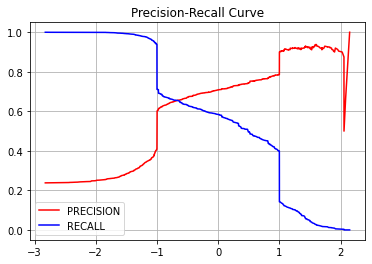

In [47]:
#tried to figure out the decision probability threshold but couldn't 
#really get it

from sklearn.metrics import precision_recall_curve
from sklearn.svm import SVC

clf = SVC()
clf.fit(x_train, y_train)

decision_function = clf.decision_function(x_test)
precision, recall, threshold = precision_recall_curve(y_test, decision_function)
  
# Plot the output.
plt.plot(threshold, precision[:-1], c ='r', label ='PRECISION')
plt.plot(threshold, recall[:-1], c ='b', label ='RECALL')
plt.grid()
plt.legend()
plt.title('Precision-Recall Curve')


In [196]:
#as we can see our dataframe has stored 1s and 0s where necessary 
#for example, CA03 states that we want to predict income for a person age
#58. Thus, we have a 1 in the age bin 36-40 and 56-60 category. 
#It states their education category is high school so in the 
#education bin "high" we have a 1. The rest follows the parameters as well. 

#we have to also make sure we use our previous parameters from test #8
#that means we have to use Entropy and:
#min samples split: 4
#max depth: 40
#min samples leaf: 20

dtree=DecisionTreeClassifier(criterion='entropy', min_samples_split=4,max_depth=40, min_samples_leaf=20)


dtree.fit(x_train,y_train)




y_pred=dtree.predict(pred_df)

print(y_pred)


#now we see if our prediciton is 1 or 0
#if it is 0, it means that our program predicts the income for a 
#person with these parameters is equal to or below 50k
#if it is 1, it means that our program predicts the income for a 
#person with these parameters is above 50k

if y_pred == 0:
  print('Income Prediction: Less than or equal to 50k')
else:
  print('Income prediction: Greater than or equal to 50 k')

x_prob=[[0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,1,0,0,0,1,0,1,0,0,0,1]]
y_pred=dtree.predict(x_prob)
prob=dtree.predict_proba(x_prob)
print('The Confidence of the prediciton is ',prob[0][y_pred])

[0]
Income Prediction: Less than or equal to 50k
The Confidence of the prediciton is  [0.72413793]


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  "X does not have valid feature names, but"
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  "X does not have valid feature names, but"


In [ ]:
#Thus, we see that we can predict witht these parameters that such a person 
#would have less than or equal to $50k income. We can also see that the 
#confidence of our prediction would be 72.4%